# Visualize CNN ( VGG in this notebook )
There are several ways to visualize CNN 
- Visualize **output** of each layer => to understand how network transform input ( need ```image``` )
- Visualize **filters** => to understand what visual pattern each filter in a convnet is receptive to
- Visualize **heatmaps** of class activation in a image ( need ```image``` )


## Visualize output 
- Load model
- Choose which output to visualize
- Get ```input``` and ```output``` of visualize layers, create new model
- Run and draw

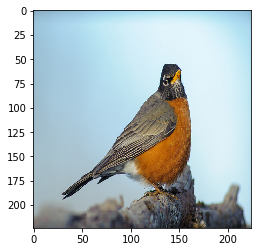

(224, 224, 3)
Block 2


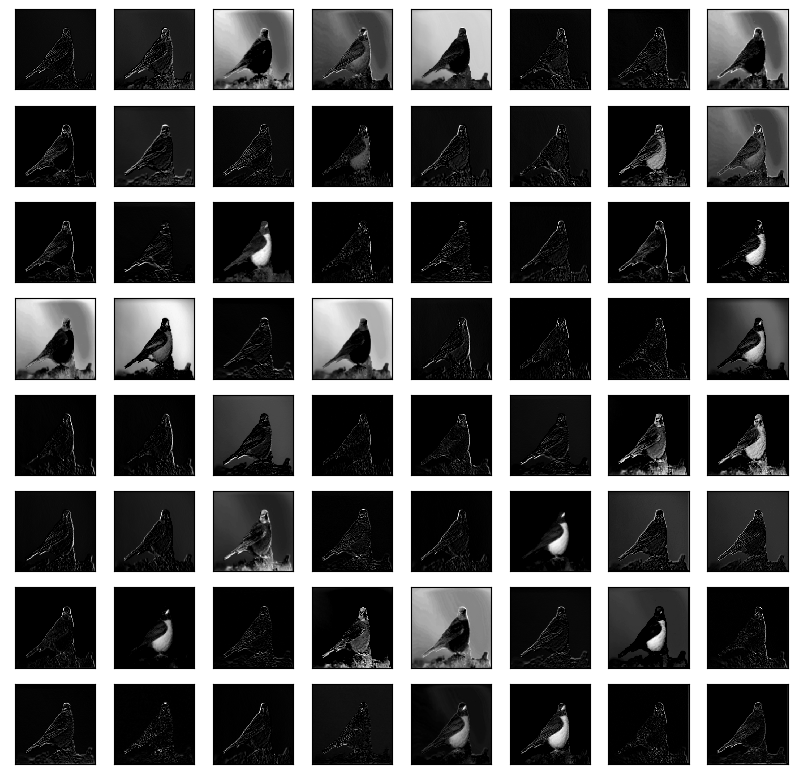

Block 5


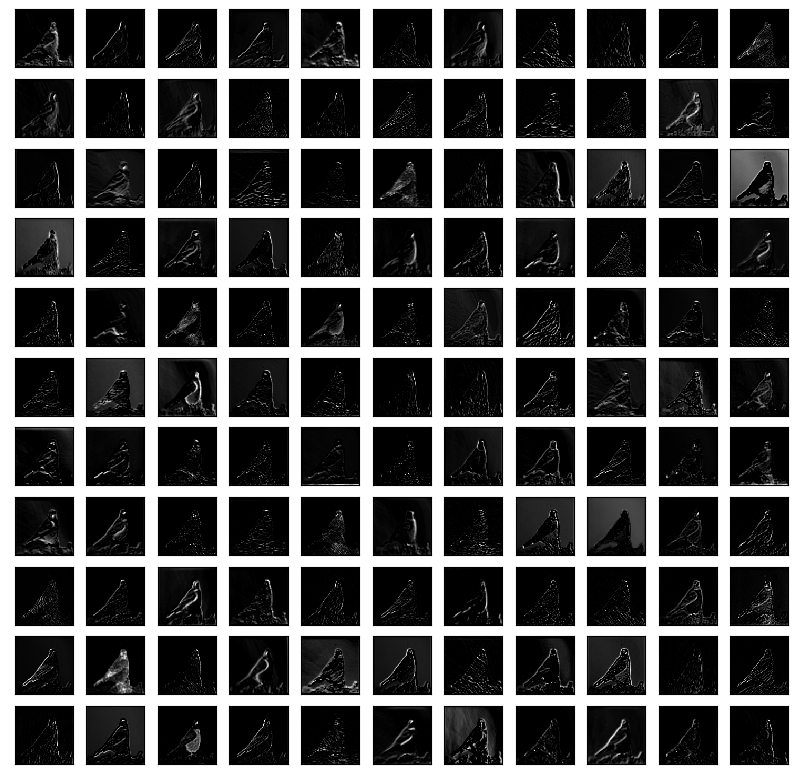

Block 9


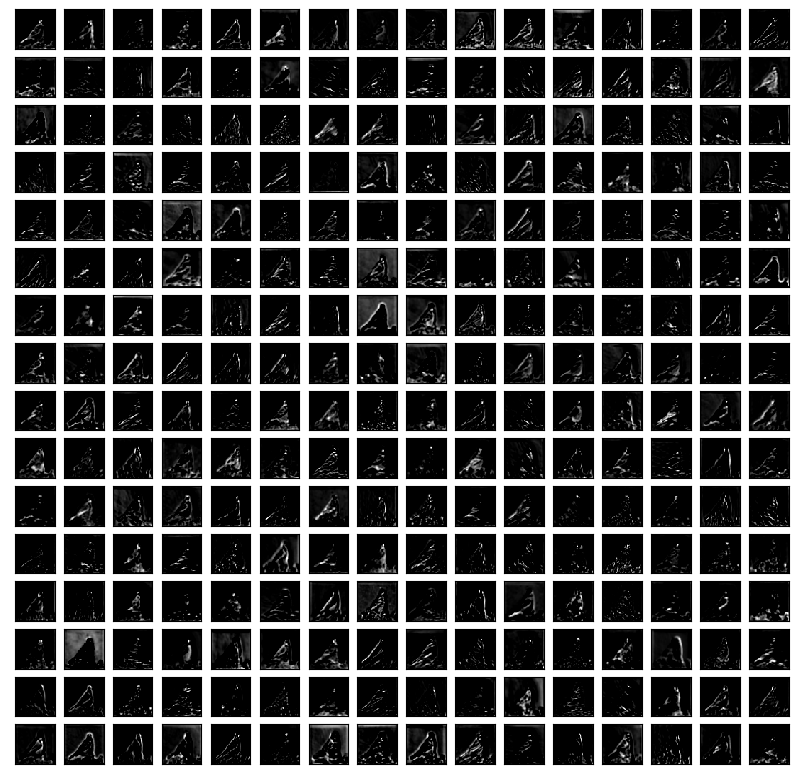

Block 13


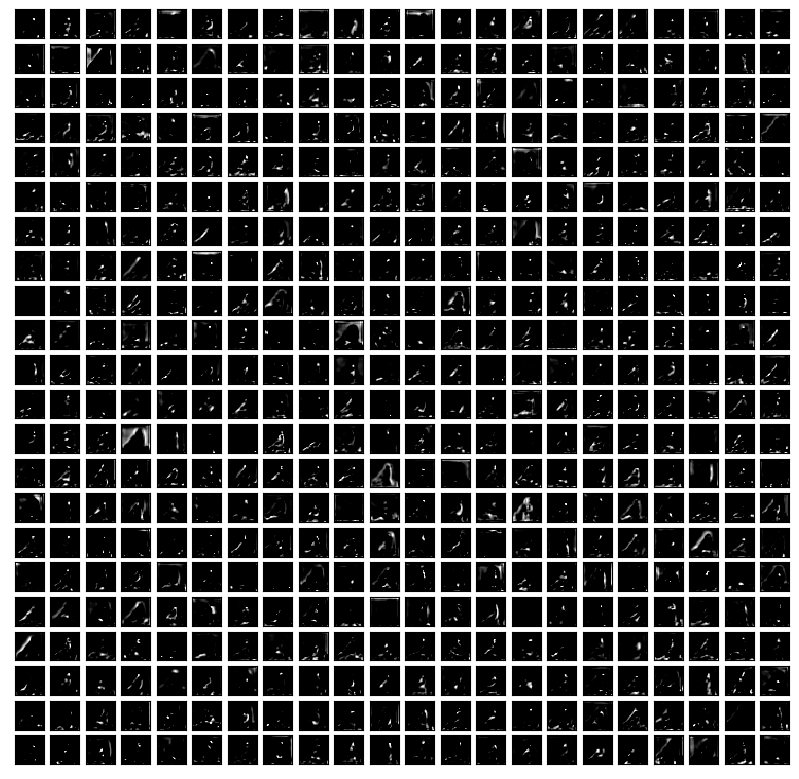

Block 17


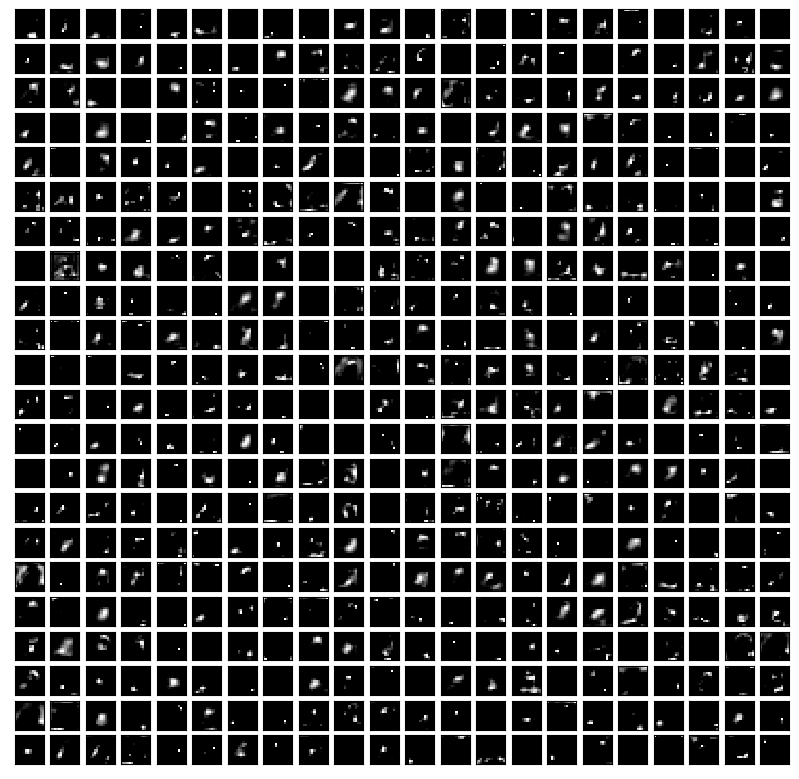

In [7]:
# visualize feature maps output from each block in the vgg model
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.models import Model
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import numpy as np
from numpy import expand_dims
# load the model
model = VGG16()
# redefine model to output right after the first hidden layer
ixs = [2, 5, 9, 13, 17]
outputs = [model.layers[i].output for i in ixs]
model = Model(inputs=model.inputs, outputs=outputs)
# load the image with the required shape
img = load_img('bird.jpg', target_size=(224, 224))
plt.imshow(img)
plt.show()
# convert the image to an array
img = img_to_array(img)
print(img.shape)
# expand dimensions so that it represents a single 'sample'
img = expand_dims(img, axis=0)
# prepare the image (e.g. scale pixel values for the vgg)
img = preprocess_input(img)
# get feature map for first hidden layer
feature_maps = model.predict(img)
# plot the output from each block
square = 8
for idx, fmap in enumerate(feature_maps):
    figure(num=None, figsize=(10, 10), dpi=100)
    square = int(np.sqrt(fmap.shape[-1])) 

    print('Block', ixs[idx])
	# plot all 64 maps in an 8x8 squares
    feature_count = 0
    for _ in range(square):
       for _ in range(square):
			# specify subplot and turn of axis
            ax = plt.subplot(square, square, feature_count+1)
            ax.set_xticks([])
            ax.set_yticks([])
            # plot filter channel in grayscale
            plt.imshow(fmap[0, :, :, feature_count], cmap='gray')
            feature_count += 1
	# show the figure
    plt.show()

## Visualize filters
> _Another easy thing to do to inspect the filters learned by convnets is to display the visual pattern that each filter is meant to respond to. This can be done with gradient ascent in input space: applying gradient descent to the value of the input image of a convnet so as to maximize the response of a specific filter, starting from a blank input image. The resulting input image would be one that the chosen filter is maximally responsive to_

- Choose layer to visualize ( include layer name and filter index )
- Calculate loss of filter output
```python
layer_out = model[layer_name].output
loss = K.mean(layer_output[:,:,:,filter_index]
```
- Define gradient between loss and input image
```python
grads = K.gradients(loss, input_image)
#normalize
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
```
- Define backend function to iterately calculate gradient descent. 
```python
iterate = K.function([input_img], [loss, grads])
```
- Calculate gradient descent for several steps to maximize filter output



In [8]:
from keras import applications
from matplotlib import pyplot as plt
from keras import backend as K 
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure

# util function to convert a tensor into a valid image
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    # x = x.transpose((1, 2, 0))
    x = np.clip(x, 0, 255).astype('uint8')
    return x

model = applications.VGG16(include_top=False, weights='imagenet')
layer_dict = dict([(layer.name, layer) for layer in model.layers])

for layer in model.layers:
    print(layer.name)

58892288/58889256 [==============================] - 2s 0us/step
input_8
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool


block1_conv1


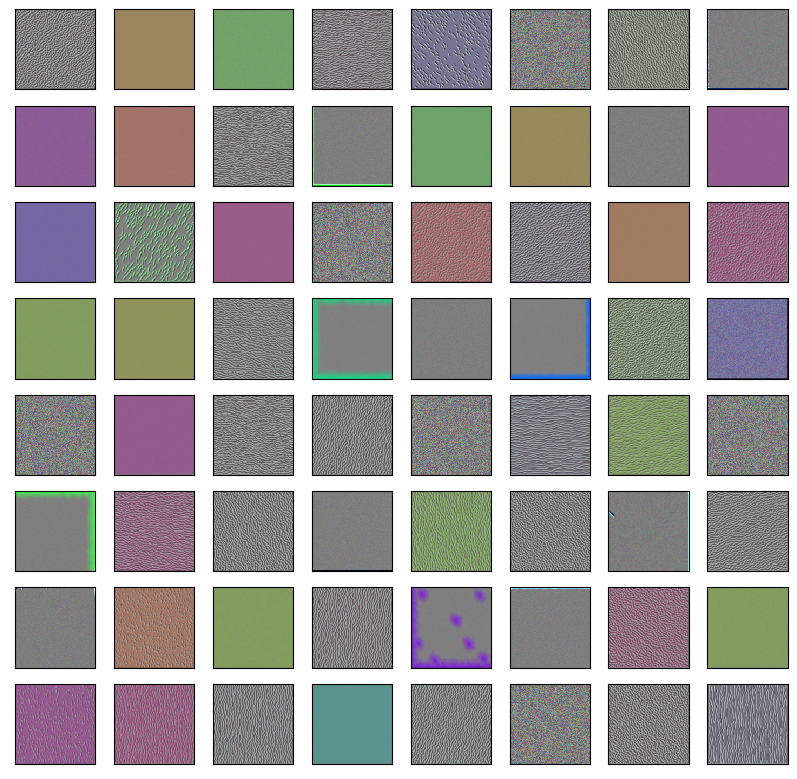

block2_conv1


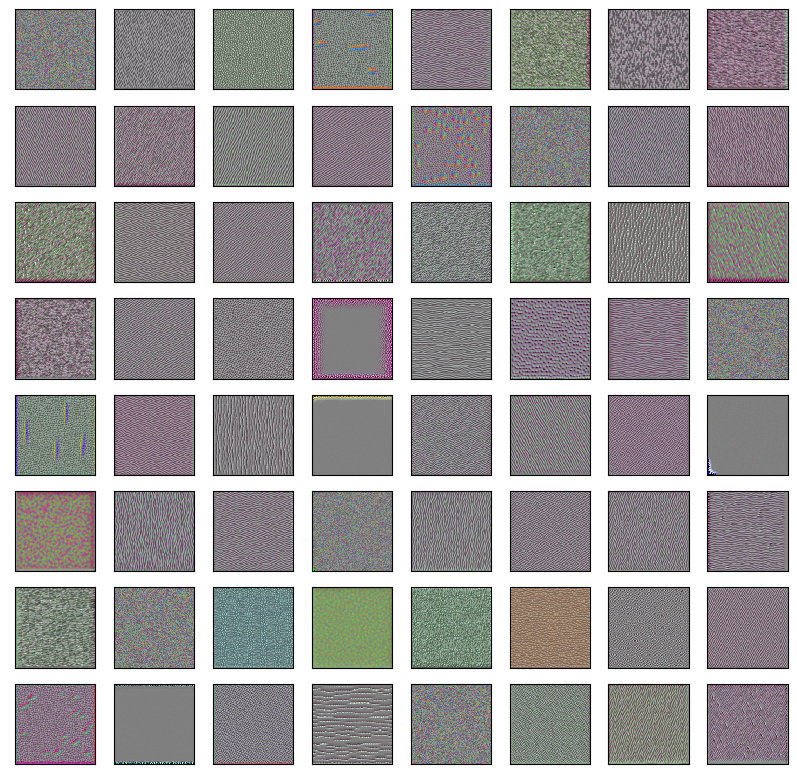

block3_conv1


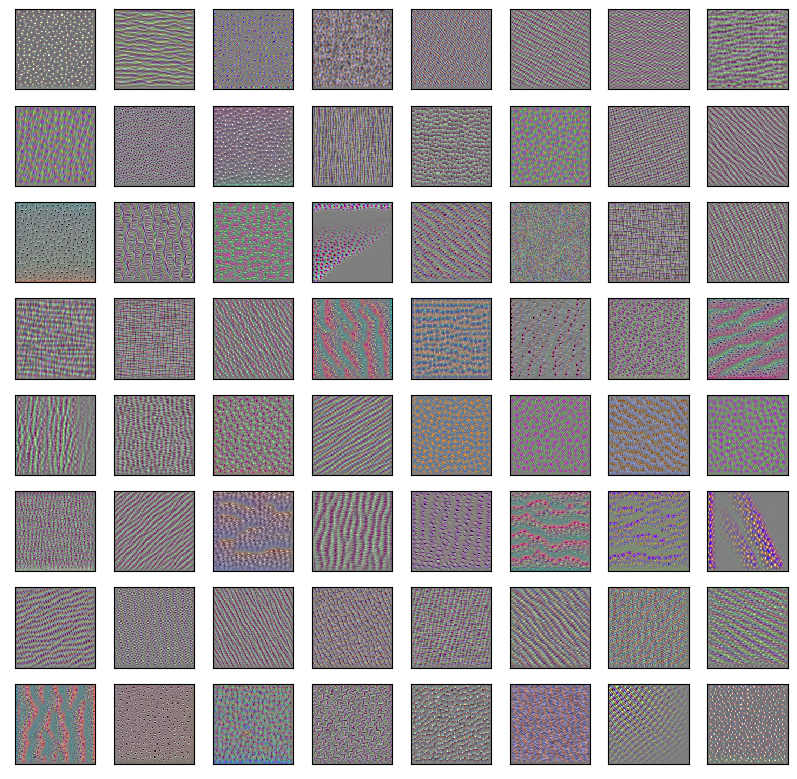

block4_conv1


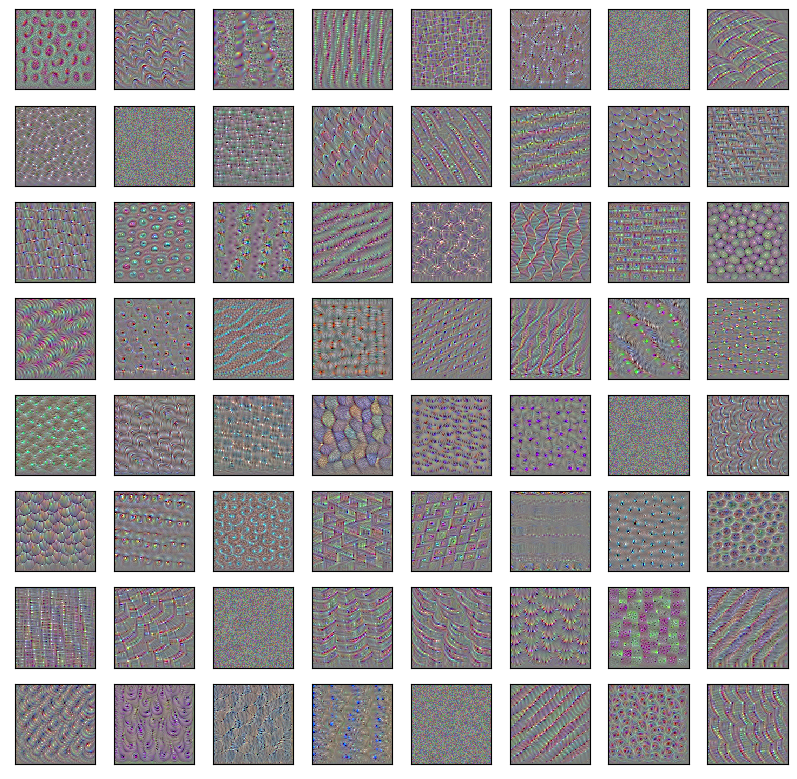

block5_conv1


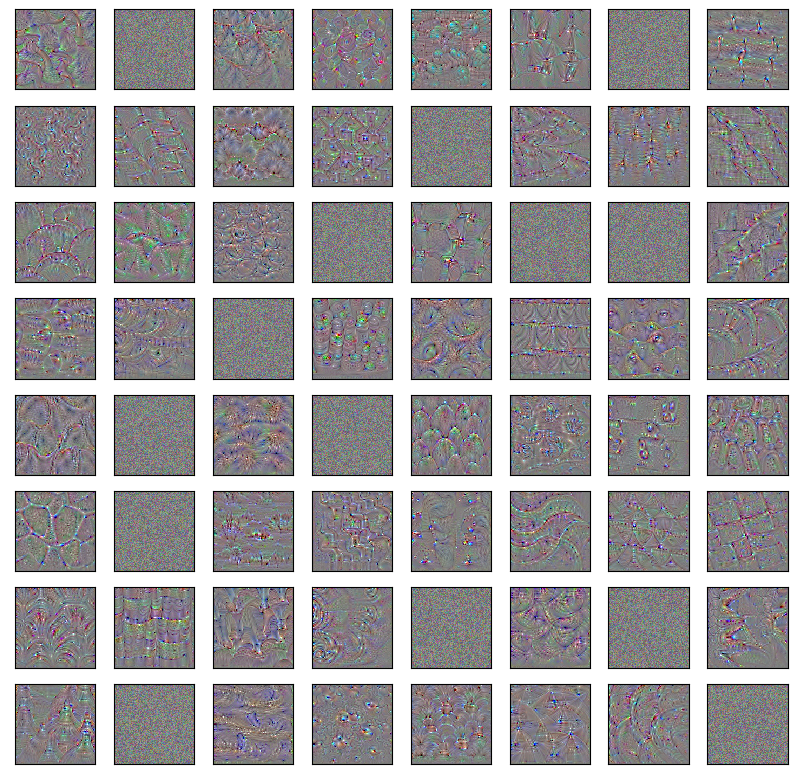

In [15]:
width_size, height_size = 150, 150

def getLayerFilter(layer_output, w, h, filter_index):
    
    loss = K.mean(layer_output[:,:,:,filter_index])

    grads = K.gradients(loss, input_img)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    iterate = K.function([input_img], [loss, grads])

    input_img_data = np.random.random((1, w, h, 3)) * 20 + 128.
    step = 1
    for i in range(140):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step

    img = input_img_data[0]
    img = deprocess_image(img)
    return img

for layer_name in ["block1_conv1", "block2_conv1", 
                     "block3_conv1", "block4_conv1", "block5_conv1"]:
# for layer_name in ["block1_conv1"]:

    figure(num=None, figsize=(10, 10), dpi=100)
    print(layer_name)
    filter_index = 5
    input_img = model.inputs[0]
    layer_output = layer_dict[layer_name].output

    col = 8
    row = 8
    feature_count = 0

    for i in range(col):
        for j in range(row):
            idx = i * 8 + j
            img = getLayerFilter(layer_output, width_size, height_size, idx)
            ax = pyplot.subplot(col, row, feature_count+1)
            ax.set_xticks([])
            ax.set_yticks([])    
            plt.imshow(img)
            feature_count += 1
    plt.show()
    
    # img = getLayerFilter(layer_output, width_size, height_size, filter_index)
    # plt.imshow(img)
    # plt.show()


## Visualize heatmap

(224, 224, 3) (1, 224, 224, 3)
14 ('n01537544', 'indigo_bunting', 0.9957028)


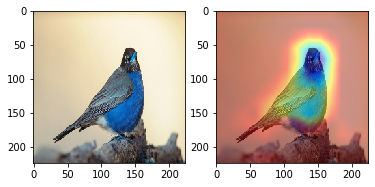

17 ('n01580077', 'jay', 0.003955426)


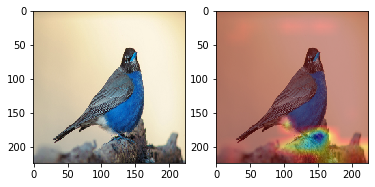

136 ('n02017213', 'European_gallinule', 0.00030833855)


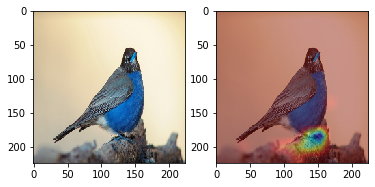

In [66]:
import cv2
# visualize feature maps output from each block in the vgg model
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.models import Model
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import numpy as np
from numpy import expand_dims
import tensorflow as tf
from keras.applications.imagenet_utils import decode_predictions

def resize_to_height(img, size=224):
    scale1 = size / img.shape[0]
    scale2 = size / img.shape[1]
    return cv2.resize(img, dsize=None, fx=scale2, fy=scale1)

def showGradCAM(model, path, layer_name, resize=224):
    img = cv2.imread(path)
    img = resize_to_height(img, resize)
    origin = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # convert to array
    x = img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    print(img.shape, x.shape)

    # predict and get class index
    preds = model.predict(x)
    label = decode_predictions(preds)
    top_n = tf.nn.top_k(preds, k=3).indices
    class_idx = K.eval(top_n)[-1][0] 
    for i, idx in enumerate(K.eval(top_n)[-1]):
        print(idx, label[0][i])
        class_idx = idx

        #calculate gradient and pool
        layer_output = model.get_layer(layer_name).output
        output = model.output[:, class_idx]
        grads = K.gradients(output, layer_output)[0]
        pooled_grads = K.mean(grads, axis=(0,1,2))

        #create heatmap
        grad_function = K.function([model.input], [pooled_grads, layer_output[0]])
        img_pooled_grads, img_layer_output = grad_function([x])
        heatmap = np.dot(img_layer_output, img_pooled_grads)
        heatmap = np.maximum(heatmap, 0)
        heatmap = heatmap / np.max(heatmap)
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
        heatmap = np.uint8(255 * heatmap)
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

        superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

        f = plt.figure()
        f.add_subplot(1,2, 1)
        plt.imshow(img)
        f.add_subplot(1,2, 2)
        plt.imshow(superimposed_img)
        plt.show(block=True)

showGradCAM(model, 'bird.jpg', 'block5_conv3')

In [0]:
output = model.output[:, 15]